#  Автор Orlovskiy Gleb 26.02.2025 v2  Черновик

In [1]:
DEBUG_MOD = True
NEED_TO_CREATE_MODEL_FROM_ZERO = False

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/200epoch_unet_apo_ferritin/tensorflow2/default/1/model_checkpoint.weights.h5
/kaggle/input/unet2d_v2_apo_ferritin/tensorflow2/default/1/model_checkpoint2.weights.h5
/kaggle/input/250epoch_unet2d_apo_ferritin0dot88532/tensorflow2/default/1/model_checkpoint2.weights.h5
/kaggle/input/200epoch_without_bridge22/tensorflow2/default/1/model_checkpoint5.weights.h5
/kaggle/input/czii-cryoet-dependencies/dask-2024.11.0-py3-none-any.whl
/kaggle/input/czii-cryoet-dependencies/aiosignal-1.3.1-py3-none-any.whl
/kaggle/input/czii-cryoet-dependencies/anyio-4.6.2.post1-py3-none-any.whl
/kaggle/input/czii-cryoet-dependencies/requests_toolbelt-1.0.0-py2.py3-none-any.whl
/kaggle/input/czii-cryoet-dependencies/psutil-6.1.0-cp36-abi3-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl
/kaggle/input/czii-cryoet-dependencies/MarkupSafe-3.0.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl
/kaggle/input/czii-cryoet-dependencies/gql-3.5.0-py2.py3-no

In [2]:
# Install zarr
#!pip install zarr
deps_path = '/kaggle/input/czii-cryoet-dependencies'

In [3]:
!cp -r /kaggle/input/czii-cryoet-dependencies/asciitree-0.3.3/ asciitree-0.3.3/

In [4]:
!pip wheel asciitree-0.3.3/asciitree-0.3.3


Processing ./asciitree-0.3.3/asciitree-0.3.3
  Preparing metadata (setup.py) ... done
  Created wheel for asciitree: filename=asciitree-0.3.3-py3-none-any.whl size=5034 sha256=9ccedc08d63789f9518c6340d741c5e4def8573e157c8174a368d628668108f9
  Stored in directory: /root/.cache/pip/wheels/77/df/a8/c6318c87827b53ea48635bf95b1249186d3d21f041176e062e
Successfully built asciitree


In [5]:
!pip install asciitree-0.3.3-py3-none-any.whl

Processing ./asciitree-0.3.3-py3-none-any.whl


In [6]:
!rm -r /kaggle/working/asciitree-0.3.3

In [7]:
!rm /kaggle/working/asciitree-0.3.3-py3-none-any.whl

In [8]:
!pip install --no-index --find-links '/kaggle/input/czii-cryoet-dependencies' zarr


Looking in links: /kaggle/input/czii-cryoet-dependencies
Processing /kaggle/input/czii-cryoet-dependencies/zarr-2.18.3-py3-none-any.whl
Processing /kaggle/input/czii-cryoet-dependencies/numcodecs-0.13.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (from zarr)
Processing /kaggle/input/czii-cryoet-dependencies/fasteners-0.19-py3-none-any.whl (from zarr)


In [9]:
!pip install --no-index --find-links '/kaggle/input/czii-cryoet-dependencies' scikit-image

Looking in links: /kaggle/input/czii-cryoet-dependencies


In [10]:
!pip install --no-index --find-links=/kaggle/input/apo-ferritin-ds-v1/tensorflow_pro tensorflow-probability

Looking in links: /kaggle/input/apo-ferritin-ds-v1/tensorflow_pro


In [11]:


import json
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zarr

In [12]:
import tensorflow as tf
import bisect

particle_radius = {
       'apo-ferritin': 60,
        'beta-amylase': 65,
        'beta-galactosidase': 90,
        'ribosome': 150,
        'thyroglobulin': 130,
        'virus-like-particle': 135,
    }

# Нужно задатаь scale для перевода координат из пикселей в реальный мир
# Более подробно: https://www.kaggle.com/competitions/czii-cryo-et-object-identification/discussion/544895#3040071
scale_matrix = tf.linalg.diag([10.012444196428572, 10.012444196428572, 10.012444537618887])
scale_matrix_inv = tf.linalg.inv(scale_matrix)
scale_radius = (scale_matrix[0][0] + scale_matrix[1][1] + scale_matrix[2][2]) / 3.0


experiments = ['TS_6_4', 'TS_69_2', 'TS_5_4',
               'TS_6_6', 'TS_73_6', 'TS_86_3',
               'TS_99_9']

data = {}

if DEBUG_MOD:
    for name in experiments:
        file_of_points = open('/kaggle/input/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/' + name + '/Picks/apo-ferritin.json')
        apo_ferritin = []
        # Будем хранить точки в пиксельных координатах, а не реальных
        for p in json.loads(file_of_points.read())['points']:
            location = np.array([float(p['location']['x']), float(p['location']['y']), float(p['location']['z'])])
            scaled_location = np.dot(scale_matrix_inv, location)  
            bisect.insort(apo_ferritin, 
                {
                    'x': scaled_location[0], 
                    'y': scaled_location[1], 
                    'z': round(scaled_location[2])
                }, key=lambda p: p['z'])

        #Рудимент: apo_ferritin = sorted(apo_ferritin, key=lambda point: point['z'])# в порядке возрастания
        path_of_imgs = '/kaggle/input/czii-cryo-et-object-identification/train/static/ExperimentRuns/' + name + '/VoxelSpacing10.000/denoised.zarr'
        data[name] = {'imgs': zarr.open(path_of_imgs, mode='r'), 'points': {'apo_ferritin': apo_ferritin}}

Хотим брать один слой и по одному с двух его боков. Хочу чтобы картинки отличались лишь случайным шумом, поэтому перебираю ниже все возможные варинты шага

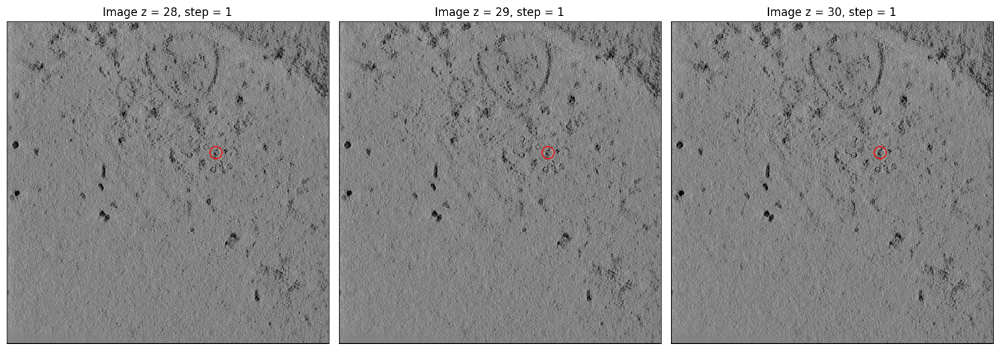

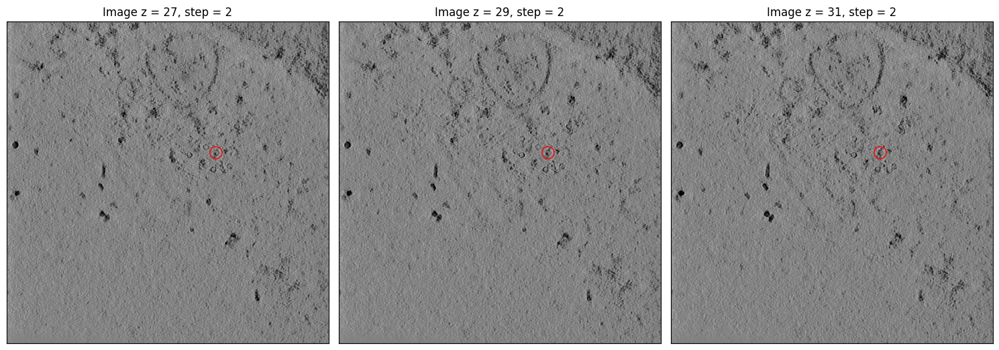

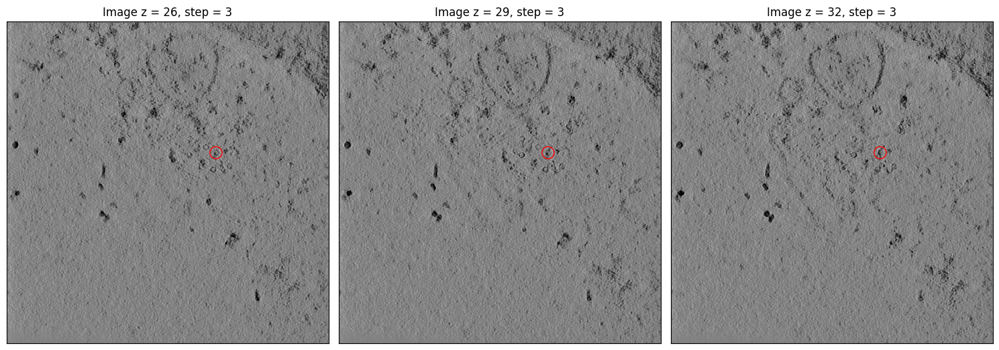

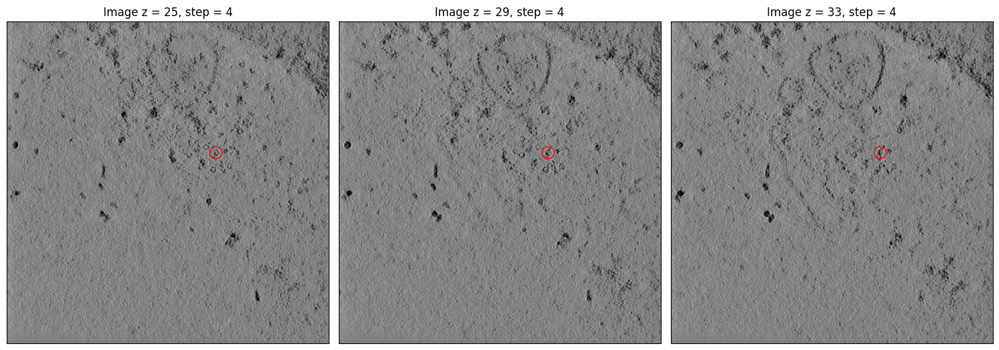

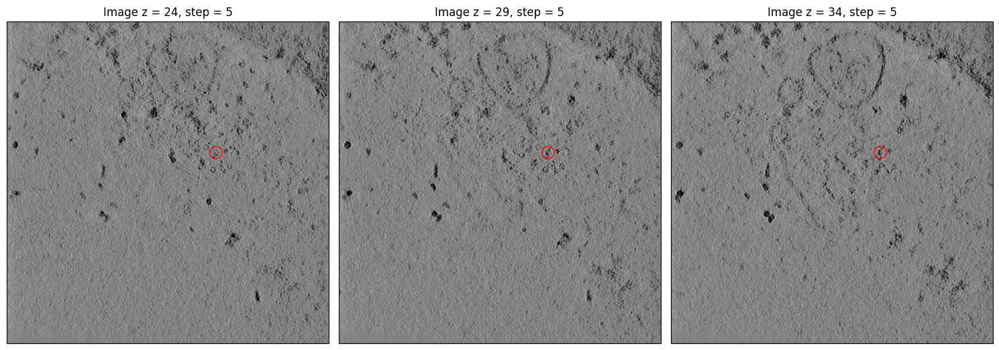

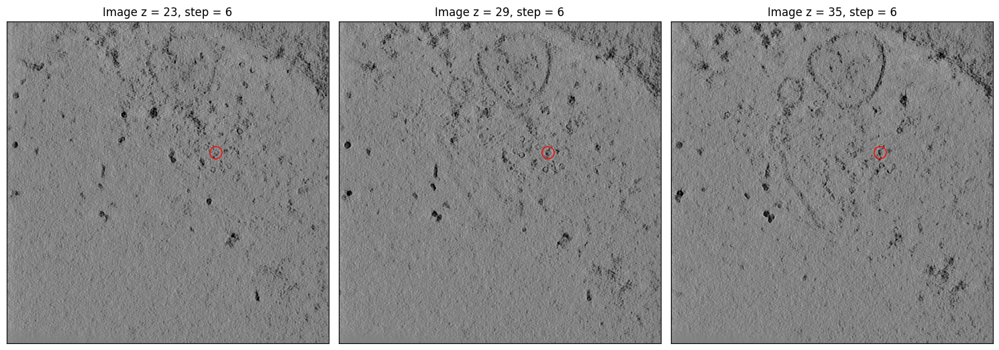

In [13]:
import matplotlib.pyplot as plt
import numpy as np

if DEBUG_MOD:
    z = 29
    for step in range(1, 7):
        # увеличим размер фигуры
        fig = plt.figure(figsize=(15, 7))
        #step = 2
        apo_ferritin_x = []
        apo_ferritin_y = []
        for p in data['TS_6_4']['points']['apo_ferritin']:# пока про оптимизацию не думаю
            if abs(p['z'] - z) < 1:
                apo_ferritin_x.append(p['x'])
                apo_ferritin_y.append(p['y'])
        ax1 = plt.subplot(1, 3, 1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(data['TS_6_4']['imgs'][0][z - step], cmap='gray', vmin=-0.00005, vmax=0.00005)
        ax1.scatter(apo_ferritin_x, apo_ferritin_y, edgecolor='red', s=np.pi*((particle_radius['apo-ferritin']/10.0)**2)*1.5, facecolor='none')
    
        plt.title(f'Image z = {z - step}, step = {step}')
        
        ax2 = plt.subplot(1, 3, 2)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(data['TS_6_4']['imgs'][0][z], cmap='gray', vmin=-0.00005, vmax=0.00005)
        plt.title(f'Image z = {z}, step = {step}')
        ax2.scatter(apo_ferritin_x, apo_ferritin_y, edgecolor='red', s=np.pi*((particle_radius['apo-ferritin']/10.0)**2)*1.5, facecolor='none')
    
        
        ax3 = plt.subplot(1, 3, 3)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(data['TS_6_4']['imgs'][0][z + step], cmap='gray', vmin=-0.00005, vmax=0.00005)
        ax3.scatter(apo_ferritin_x, apo_ferritin_y, edgecolor='red', s=np.pi*((particle_radius['apo-ferritin']/10.0)**2)*1.5, facecolor='none')
    
        plt.title(f'Image z = {z + step}, step = {step}')
        # Настройка отступов для полного размера изображения
        plt.tight_layout()
        
        plt.show()

In [14]:
if DEBUG_MOD: 
    print(data['TS_6_4']['imgs'][0][10].shape)

(630, 630)


receptive field for (10, 10)tf.Tensor([33 33 50 50], shape=(4,), dtype=int32)
receptive field for (10, 11)tf.Tensor([33 37 50 54], shape=(4,), dtype=int32)
17/2 - (particle radius apo-ferrinit)/((scale radius)) = tf.Tensor(2.5074573, shape=(), dtype=float32)
tf.Tensor(
[[[  1.5   1.5]
  [  5.5   1.5]
  [  9.5   1.5]
  ...
  [621.5   1.5]
  [625.5   1.5]
  [629.5   1.5]]

 [[  1.5   5.5]
  [  5.5   5.5]
  [  9.5   5.5]
  ...
  [621.5   5.5]
  [625.5   5.5]
  [629.5   5.5]]

 [[  1.5   9.5]
  [  5.5   9.5]
  [  9.5   9.5]
  ...
  [621.5   9.5]
  [625.5   9.5]
  [629.5   9.5]]

 ...

 [[  1.5 621.5]
  [  5.5 621.5]
  [  9.5 621.5]
  ...
  [621.5 621.5]
  [625.5 621.5]
  [629.5 621.5]]

 [[  1.5 625.5]
  [  5.5 625.5]
  [  9.5 625.5]
  ...
  [621.5 625.5]
  [625.5 625.5]
  [629.5 625.5]]

 [[  1.5 629.5]
  [  5.5 629.5]
  [  9.5 629.5]
  ...
  [621.5 629.5]
  [625.5 629.5]
  [629.5 629.5]]], shape=(158, 158, 2), dtype=float32)


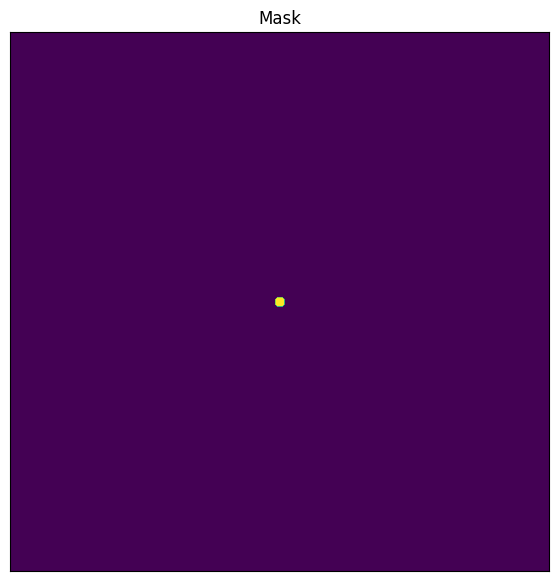

In [15]:
import tensorflow as tf
from tensorflow.keras import layers, models


def build_model(input_shape=(630, 630, 3)):
    # сегментирует с fбета метрикой 0.87469 на тестовом датасете
    #/kaggle/input/200epoch_without_bridge22/tensorflow2/default/1/model_checkpoint5.weights.h5
    inputs = layers.Input(shape=input_shape)
    padded_inputs = layers.ZeroPadding2D(padding=((5, 5), (5, 5)))(inputs)  # 630x630 -> 640x640
    
    # Энкодер
    c1 = layers.Conv2D(32, (3, 3), padding='same')(padded_inputs)
    c1 = layers.ReLU()(c1)
    c1 = layers.Conv2D(32, (3, 3), padding='same')(c1)
    c1 = layers.ReLU()(c1)
    p1 = layers.MaxPooling2D((2, 2), padding='same')(c1)  # 640x640 -> 320x320
    
    c2 = layers.Conv2D(64, (3, 3), padding='same')(p1)
    c2 = layers.ReLU()(c2)
    c2 = layers.Conv2D(64, (3, 3), padding='same')(c2)
    c2 = layers.ReLU()(c2)
    p2 = layers.MaxPooling2D((2, 2), padding='same')(c2)  # 320x320 -> 160x160
    
    # Декодер
    u4 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(p2)  # 160x160 -> 320x320
    u4 = layers.concatenate([u4, c2])
    c4 = layers.Conv2D(64, (3, 3), padding='same')(u4)
    c4 = layers.ReLU()(c4)
    c4 = layers.Conv2D(64, (3, 3), padding='same')(c4)
    c4 = layers.ReLU()(c4)
    
    u5 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c4)  # 320x320 -> 640x640
    u5 = layers.concatenate([u5, c1])
    c5 = layers.Conv2D(32, (3, 3), padding='same')(u5)
    c5 = layers.ReLU()(c5)
    c5 = layers.Conv2D(32, (3, 3), padding='same')(c5)
    c5 = layers.ReLU()(c5)
    
    # Выходной слой
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c5)  # 640x640
    outputs = layers.Cropping2D(cropping=((5, 5), (5, 5)))(outputs)  # 640x640 -> 630x630
    
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

"""
def build_model(input_shape=(630, 630, 3)):
    #/kaggle/input/200epoch_unet_apo_ferritin/tensorflow2/default/1/model_checkpoint.weights.h5
    inputs = layers.Input(shape=input_shape)
    padded_inputs = layers.ZeroPadding2D(padding=((5, 5), (5, 5)))(inputs)  # 630x630 -> 640x640
    
    # Энкодер
    c1 = layers.Conv2D(32, (3, 3), padding='same')(padded_inputs)
    c1 = layers.ReLU()(c1)
    c1 = layers.Conv2D(32, (3, 3), padding='same')(c1)
    c1 = layers.ReLU()(c1)
    p1 = layers.MaxPooling2D((2, 2), padding='same')(c1)  # 640x640 -> 320x320
    
    c2 = layers.Conv2D(64, (3, 3), padding='same')(p1)
    c2 = layers.ReLU()(c2)
    c2 = layers.Conv2D(64, (3, 3), padding='same')(c2)
    c2 = layers.ReLU()(c2)
    p2 = layers.MaxPooling2D((2, 2), padding='same')(c2)  # 320x320 -> 160x160
    
    # Мост
    c3 = layers.Conv2D(128, (3, 3), padding='same')(p2)
    c3 = layers.ReLU()(c3)
    c3 = layers.Conv2D(128, (3, 3), padding='same')(c3)
    c3 = layers.ReLU()(c3)
    
    # Декодер
    u4 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c3)  # 160x160 -> 320x320
    u4 = layers.concatenate([u4, c2])
    c4 = layers.Conv2D(64, (3, 3), padding='same')(u4)
    c4 = layers.ReLU()(c4)
    c4 = layers.Conv2D(64, (3, 3), padding='same')(c4)
    c4 = layers.ReLU()(c4)
    
    u5 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c4)  # 320x320 -> 640x640
    u5 = layers.concatenate([u5, c1])
    c5 = layers.Conv2D(32, (3, 3), padding='same')(u5)
    c5 = layers.ReLU()(c5)
    c5 = layers.Conv2D(32, (3, 3), padding='same')(c5)
    c5 = layers.ReLU()(c5)
    
    # Выходной слой
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c5)  # 640x640
    outputs = layers.Cropping2D(cropping=((5, 5), (5, 5)))(outputs)  # 640x640 -> 630x630
    
    model = models.Model(inputs=inputs, outputs=outputs)
    return model
"""


#слои сети энекодера без последнего маспулинга 
layers_of_model = [{'name': 'conv2d'},
                   {'name': 'maxp2d'},
                   {'name': 'conv2d'},
                   {'name': 'maxp2d'},
                   {'name': 'conv2d'}]


@tf.function
def get_receptive_field(layers, pixel_in_out):
    '''
    layers слои модели
    pixel_in_out пиксель tuple на выходе модели которого хотим посчитать рецептивное поле
    return рецептивное поле
    '''
    start_x, start_y = pixel_in_out
    end_x, end_y = start_x, start_y
    
    for layer in layers[::-1]:
        if layer['name'] == 'conv2d':
            # Свертка увеличивает receptive field на 2 (по 1 пикселю с каждой стороны)
            start_x = start_x - 1
            start_y = start_y - 1
            end_x = end_x + 1
            end_y = end_y + 1
        elif layer['name'] == 'maxp2d':
            # Макспулинг увеличивает receptive field в 2 раза
            start_x = start_x * 2
            start_y = start_y * 2
            end_x = end_x * 2 + 1
            end_y = end_y * 2 + 1

    return tf.stack([start_x, start_y, end_x, end_y], axis=-1)

if DEBUG_MOD:
    print('receptive field for (10, 10)' + str(get_receptive_field(layers_of_model, (10, 10))))
    print('receptive field for (10, 11)' + str(get_receptive_field(layers_of_model, (10, 11))))

@tf.function
def get_receptive_field(layers, pixel_in_out):
    '''
    Вычисляет рецептивное поле для пикселя на выходной карте 158x158.
    Args:
        layers: Список слоев модели.
        pixel_in_out: Tuple (x, y) - координаты пикселя на выходе.
    Returns:
        Тензор [start_x, start_y, end_x, end_y] в координатах 630x630.
    '''
    start_x, start_y = tf.cast(pixel_in_out[0], tf.int32), tf.cast(pixel_in_out[1], tf.int32)
    end_x, end_y = start_x, start_y
    
    for layer in layers[::-1]:
        if layer['name'] == 'conv2d':
            start_x -= 1
            start_y -= 1
            end_x += 1
            end_y += 1
        elif layer['name'] == 'maxp2d':
            start_x *= 2
            start_y *= 2
            end_x = end_x * 2 + 1
            end_y = end_y * 2 + 1

    return tf.stack([start_x, start_y, end_x, end_y], axis=-1)

@tf.function
def get_centers_of_receptive_fields():
    """
    Вычисляет центры рецептивных полей для сетки 158x158.
    out:
        Тензор формы (158, 158, 2) с координатами [center_x, center_y].
    """
    x_coords = tf.range(158, dtype=tf.int32)
    y_coords = tf.range(158, dtype=tf.int32)
    xx, yy = tf.meshgrid(x_coords, y_coords)
    '''
        xx = [[0, 1, 2, ..., 157],
             [0, 1, 2, ..., 157],
                 ...,
             [0, 1, 2, ..., 157]]

        yy = [[0, 0, 0, ..., 0],
             [1, 1, 1, ..., 1],
                 ...,
             [157, 157, 157, ..., 157]]
    '''
    grid = tf.stack([xx, yy], axis=-1)  # (158, 158, 2)
    '''
    тензор grid формы (158, 158, 2), где:
    grid[i, j, 0] — это значение из xx[i, j] (X-координата).
    grid[i, j, 1] — это значение из yy[i, j] (Y-координата).
    '''
    flat_grid = tf.reshape(grid, [-1, 2])  # (158*158, 2)
    '''
    flat_grid = [[0, 0],    # grid[0, 0]
                 [1, 0],    # grid[0, 1]
                 [2, 0],    # grid[0, 2]
                 ...,
                 [157, 0],  # grid[0, 157]
                 [0, 1],    # grid[1, 0]
                 ...,
                 [157, 157]] # grid[157, 157]
    '''

    field_flat = tf.map_fn(
        lambda xy: tf.cast(get_receptive_field(layers_of_model, xy), tf.float32),
        flat_grid,
        dtype=tf.float32
    )  # (158*158, 4) применили к каждому элементу из flat_grid лямбда функцию

    field = tf.reshape(field_flat, (158, 158, 4))  # (158, 158, 4)
    center_x = (field[..., 0] + field[..., 2]) / 2.0  # (158, 158)
    center_y = (field[..., 1] + field[..., 3]) / 2.0  # (158, 158)
    centers = tf.stack([center_x, center_y], axis=-1)  # (158, 158, 2)
    return centers

centers_of_receptive_fields = get_centers_of_receptive_fields()

@tf.function
def create_mask(points, radius=particle_radius['apo-ferritin']/scale_radius, debug=False):
    """
    Создает бинарную маску (630, 630) на основе расстояний до центров.
    
    in:
        points: Тензор формы (N, 2) или (2,) с координатами центров [x, y] в 630x630.
        radius: Радиус области вокруг центров
    
    out:
        Тензор (630, 630), где 1 - внутри радиуса, 0 - вне.
    """
    # преобразуем points в тензор, если это не тензор
    points = tf.convert_to_tensor(points, dtype=tf.float32)
    
    # проверяем форму входных данных
    if len(points.shape) == 1:
        points = tf.expand_dims(points, axis=0)  # Преобразуем (2,) в (1, 2)
    elif len(points.shape) != 2 or points.shape[1] != 2:
        raise ValueError("points должен быть формы (N, 2) или (2,)")
    
    if debug:
        print(f"Количество точек: {points.shape[0]}")
        print(f"Координаты точек:\n{points.numpy()}")
    
    x = tf.range(0, 630, dtype=tf.float32)
    y = tf.range(0, 630, dtype=tf.float32)
    X, Y = tf.meshgrid(x, y)
    '''
    X = [[0, 1, 2, ..., 629],
         [0, 1, 2, ..., 629],
             ...
         [0, 1, 2, ..., 629]]
    Y = [[0, 0, 0, ..., 0],
         [1, 1, 1, ..., 1],
             ...
         [629, 629, 629, ..., 629]]
    '''
    
    mask = tf.zeros((630, 630), dtype=tf.float32)
    
    # Для каждой точки обновляем маску
    for i in range(points.shape[0]):
        center_x, center_y = points[i, 0], points[i, 1]
        
        if debug:
            print(f"Обработка точки {i+1}: x={center_x.numpy()}, y={center_y.numpy()}")
        
        # Вычисляем расстояние от каждой точки сетки до текущего центра
        distances = tf.sqrt((X - center_x) ** 2 + (Y - center_y) ** 2)
        
        # Обновляем маску: 1 там, где расстояние меньше радиуса
        point_mask = tf.cast(distances <= radius, tf.float32)
        mask = tf.maximum(mask, point_mask)  # Объединяем маски для нескольких точек
    
    if debug:
        print(f"Минимальное значение маски: {tf.reduce_min(mask).numpy()}")
        print(f"Максимальное значение маски: {tf.reduce_max(mask).numpy()}")
        print(f"Количество пикселей внутри радиуса: {tf.reduce_sum(mask).numpy()}")
    
    return mask

if DEBUG_MOD:
    fig = plt.figure(figsize=(15, 7))
    ax1 = plt.subplot(1, 1, 1)              
    plt.xticks([])
    plt.yticks([])
    plt.title('Mask')
    mask = create_mask([[630/2, 630/2]]).numpy()
    plt.imshow(mask)

print(centers_of_receptive_fields)

In [16]:
if DEBUG_MOD:
    count = 0
    for experiment in experiments:
        count += len(data[experiment]['points']['apo_ferritin'])
        print(experiment + ' ' + str(len(data[experiment]['points']['apo_ferritin'])))
    print(count)
    print(experiments)

TS_6_4 58
TS_69_2 35
TS_5_4 46
TS_6_6 41
TS_73_6 95
TS_86_3 64
TS_99_9 36
375
['TS_6_4', 'TS_69_2', 'TS_5_4', 'TS_6_6', 'TS_73_6', 'TS_86_3', 'TS_99_9']


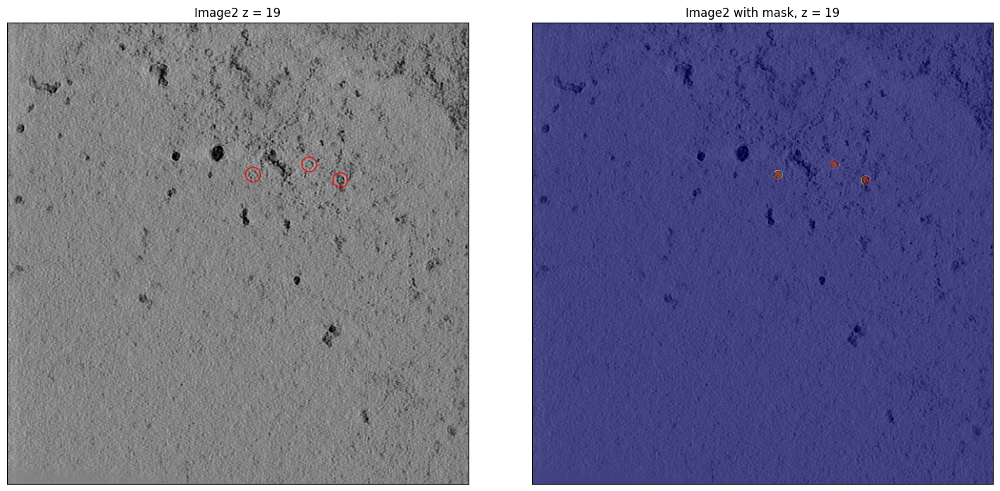

(630, 630)


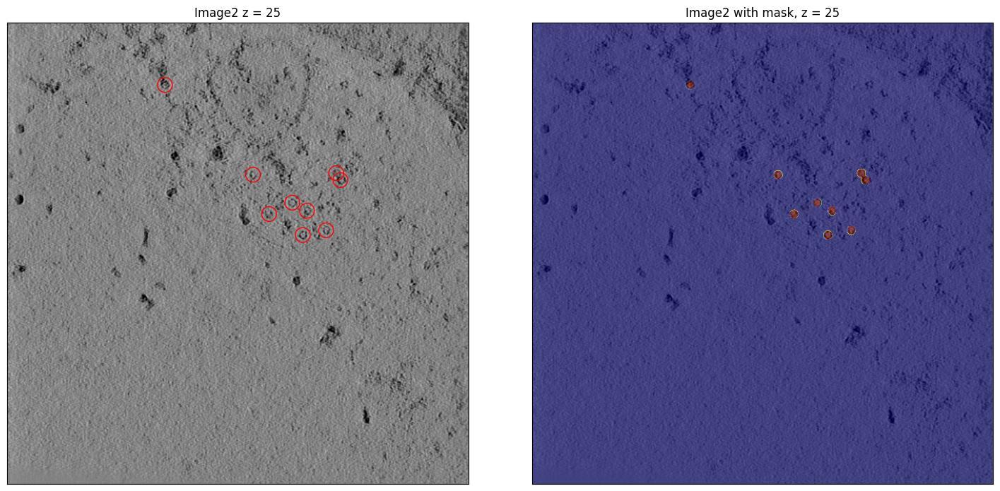

(630, 630)


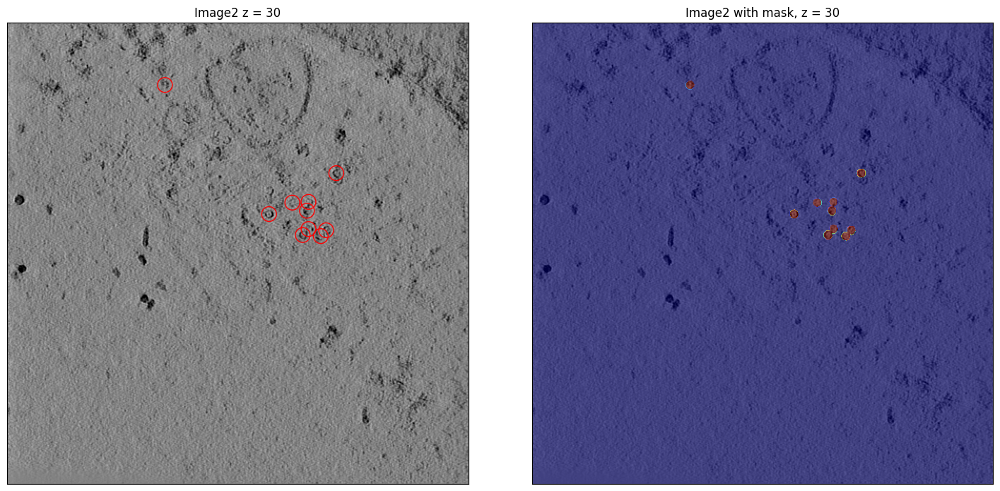

(630, 630)


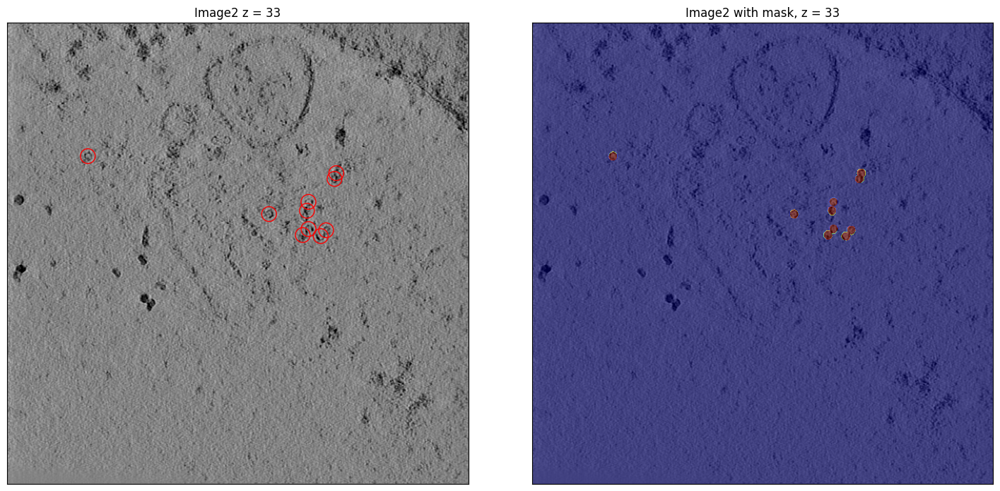

(630, 630)


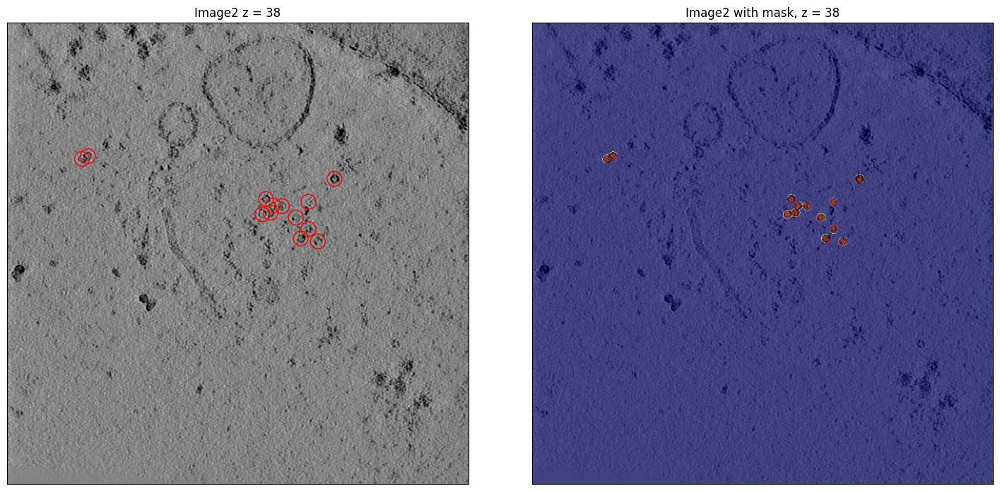

(630, 630)


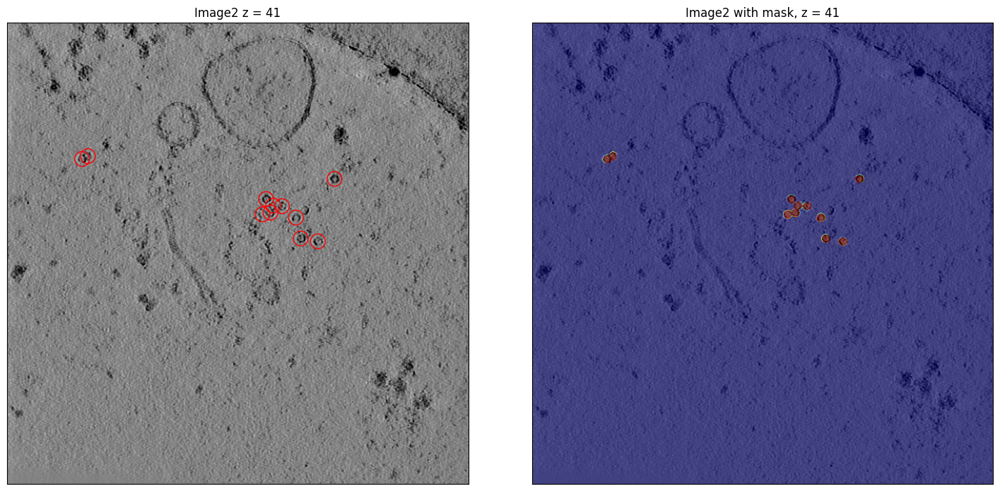

(630, 630)


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as patches
from skimage.transform import resize

#по всем эксперементам выдает 123 обучающих данных, только по 'TS_6_4' выдает 18, получается без него 105
def data_generator(experiments, debug=0):
    for experiment in experiments:
        ferritin = data[experiment]['points']['apo_ferritin']# Они отсортированы по z по возрастанию

        i = 0
        while i < len(ferritin):
            points = [np.array([ferritin[i]['x'], ferritin[i]['y'], ferritin[i]['z']])]
            # Хотим получить все точки из близких слоев по z
            z_range = (particle_radius['apo-ferritin']/scale_radius)
            # Идем вверх:
            u = 1
            while i + u < len(ferritin) and abs(ferritin[min(i + u, len(ferritin) - 1)]['z'] - ferritin[i]['z']) < z_range:
                points.append(np.array([ferritin[i + u]['x'], ferritin[i + u]['y'], ferritin[i + u]['z']]))
                u += 1
            # Идем вниз:
            d = 1
            while i - d >= 0 and abs(ferritin[max(0, i - d)]['z'] - ferritin[i]['z']) < z_range:
                points.append(np.array([ferritin[i - d]['x'], ferritin[i - d]['y'], ferritin[i - d]['z']]))
                d += 1
    
            z_mean = ferritin[i]['z'] 
            z_step = 2
            '''
            Рудимент:
            image1 = data[experiment]['imgs'][0][max(0, z_mean - z_step)]
            image2 = data[experiment]['imgs'][0][z_mean]
            image3 = data[experiment]['imgs'][0][min(len(data[experiment]['imgs'][0]) - 1, z_mean + z_step)] 
                
            image = np.stack([image1, image2, image3], axis=-1)
            mask = create_mask([(np.array([point[0], point[1]])) for point in points])
            '''
            image1 = tf.convert_to_tensor(data[experiment]['imgs'][0][max(0, z_mean - z_step)], dtype=tf.float32)
            image2 = tf.convert_to_tensor(data[experiment]['imgs'][0][z_mean], dtype=tf.float32)
            image3 = tf.convert_to_tensor(data[experiment]['imgs'][0][min(len(data[experiment]['imgs'][0]) - 1, z_mean + z_step)], dtype=tf.float32)
                
            # Составляем изображение из слоев
            image = tf.stack([image1, image2, image3], axis=-1)

            points2d = tf.convert_to_tensor([np.array([point[0], point[1]]) for point in points], dtype=tf.float32)
            mask = create_mask(points2d)

            # Шаг:
            i = i + round(u / 2.0) + 1
            # не знаю лучше или хуже деление на 2 - хотел увеличить кол-во полезных данных
            if debug == 1:
                fig = plt.figure(figsize=(15, 7))
                ax1 = plt.subplot(1, 2, 1)
                plt.xticks([])
                plt.yticks([])
                plt.title('Image2 z = ' + str(z_mean))
                ax1.scatter([point[0] for point in points], [point[1] for point in points], edgecolor='red', s=np.pi*((particle_radius['apo-ferritin']/10.0 + 2.5)**2), facecolor='none')
                plt.imshow(image2, cmap='gray', vmin=-0.00005, vmax=0.00005)
    
                ax2 = plt.subplot(1, 2, 2)
                plt.xticks([])
                plt.yticks([])
                plt.title('Image2 with mask, z = ' + str(z_mean))
                plt.imshow(image2, cmap='gray', vmin=-0.00005, vmax=0.00005)
                plt.imshow(resize(mask.numpy(), (630, 630), mode='constant', preserve_range=True), cmap='jet', alpha=0.5)
                
                plt.tight_layout()
                plt.show()
                print(mask.shape)
            yield image, mask

if DEBUG_MOD:    
    #отобразим выбранный средний слой и обрезанное с маской из генератора
    for j, _ in enumerate(data_generator(experiments, debug=1)):
        if j >= 5:
            break

In [18]:
import numpy as np
import tensorflow as tf
import os
import tensorflow_probability as tfp
from pympler import asizeof

@tf.function
def augment(image, mask):
    """
    Применяет случайные аугментации к изображению и маске
    Вдохновленно топ1 решением https://www.kaggle.com/competitions/czii-cryo-et-object-identification/discussion/561440
    in:
        image: Тензор изображения формы (630, 630, 3).
        mask: Тензор маски формы (630, 630).
    
    out:
        augmented_image: Аугментированное изображение формы (630, 630, 3).
        augmented_mask: Аугментированная маска формы (630, 630).
    """
    # Добавляем канал к маске
    mask = tf.expand_dims(mask, axis=-1)  # (630, 630) -> (630, 630, 1)
    
    # Объединяем изображение и маску для одновременной аугментации
    combined = tf.concat([image, mask], axis=-1)  # (630, 630, 4)
    
    # Случайный поворот вдоль оси Z (0°, 90°, 180°, 270°)
    rotation_id = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)  # Случайный выбор: 0, 1, 2, 3
    combined = tf.image.rot90(combined, k=rotation_id)  # Поворот на 0°, 90°, 180°, 270°

    # Случайные отражения с вероятностью 50%
    if tf.random.uniform([]) < 0.5:  # Отражение по оси X (вертикальное)
        combined = tf.image.flip_up_down(combined)
    if tf.random.uniform([]) < 0.5:  # Отражение по оси Y (горизонтальное)
        combined = tf.image.flip_left_right(combined)
    
    # Разделяем изображение и маску
    augmented_image = combined[..., :3]  # (630, 630, 3)
    augmented_mask = combined[..., 3:]   # (630, 630, 1)
    
    # Убираем канал у маски
    augmented_mask = tf.squeeze(augmented_mask, axis=-1)  # (630, 630, 1) -> (630, 630)
    
    return augmented_image, augmented_mask

@tf.function
def normalize_image(image, lower_quantile=0.05, upper_quantile=0.95):
    image = tf.convert_to_tensor(image, dtype=tf.float32)  
    lower = tfp.stats.percentile(image, lower_quantile * 100, interpolation='linear')
    upper = tfp.stats.percentile(image, upper_quantile * 100, interpolation='linear')
    image = tf.clip_by_value(image, lower, upper) 
    image = (image - lower) / (upper - lower)  
    return image
'''
def get_tf_dataloader(batch_size=8, lower_quantile=0.05, upper_quantile=0.95,
                      test_experiments=['TS_6_4'],
                      train_experiments=['TS_69_2', 'TS_5_4', 'TS_6_6', 'TS_73_6', 'TS_86_3', 'TS_99_9'],
                      dataset_path="/kaggle/input/unet-apo-ferritin/unet2d_apo-ferritin_ds.npz"):
    def load_and_process_data(experiments, with_aug = False):
        def generator():
            while True:        
                for image, mask in data_generator(experiments):
                    image = normalize_image(image)
                    mask = tf.cast(mask, tf.float32)
                    if with_aug:
                        yield augment(image, mask)
                    else:
                        yield image, mask
                if (not with_aug): break

        return generator
        
    train_gen = load_and_process_data(train_experiments, with_aug = True)
    test_gen = load_and_process_data(test_experiments, with_aug = False)
    # Создание tf.data.Dataset
    print('Создаем train dataset')
    train_dataset = tf.data.Dataset.from_generator(
        train_gen,
        output_signature=(
            tf.TensorSpec(shape=(630, 630, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(630, 630), dtype=tf.float32)
        )
    ).batch(batch_size).prefetch(tf.data.AUTOTUNE).repeat()
    print('Создаем test dataset')
    test_dataset = tf.data.Dataset.from_generator(
        test_gen,
        output_signature=(
            tf.TensorSpec(shape=(630, 630, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(630, 630), dtype=tf.float32)
        )
    ).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    print('Готово!')
    return train_dataset, test_dataset
'''


def get_tf_dataloader(batch_size=8, lower_quantile=0.05, upper_quantile=0.95,
                      test_experiments=['TS_6_4'],
                      train_experiments=['TS_69_2', 'TS_5_4', 'TS_6_6', 'TS_73_6', 'TS_86_3', 'TS_99_9'],
                      dataset_path="/kaggle/input/unet2d-apo-ferritin-ds/unet2d_apo-ferritin_ds1050.npz"):
    def load_and_process_data(experiments, with_aug = False):
        def generator():
            while True:        
                for image, mask in data_generator(experiments):
                    image = normalize_image(image)
                    mask = tf.cast(mask, tf.float32)
                    if with_aug:
                        yield augment(image, mask)
                    else:
                        yield image, mask
                if (not with_aug): break

        return generator

    # Проверяем, существует ли сохранённый датасет
    if os.path.exists(dataset_path):
        print(f"Загружаем датасет из {dataset_path}...")
        data = np.load(dataset_path)
        train_images = data["train_images"]
        train_masks = data["train_masks"]
        test_images = data["test_images"]
        test_masks = data["test_masks"]
        print("Датасет загружен с диска")
    else:
        # Создаём датасет, если файла нет
        print("Создаем датасет...")

        # Генераторы данных
        train_gen = load_and_process_data(train_experiments, with_aug = True)
        test_gen = load_and_process_data(test_experiments, with_aug = False)

        # Создание tf.data.Dataset
        print('Создаем train dataset')
        train_dataset = tf.data.Dataset.from_generator(
            train_gen,
            output_signature=(
                tf.TensorSpec(shape=(630, 630, 3), dtype=tf.float32),
                tf.TensorSpec(shape=(630, 630), dtype=tf.float32)
            )
        )
        print('Создаем test dataset')
        test_dataset = tf.data.Dataset.from_generator(
            test_gen,
            output_signature=(
                tf.TensorSpec(shape=(630, 630, 3), dtype=tf.float32),
                tf.TensorSpec(shape=(630, 630), dtype=tf.float32)
            )
        )

        # Кэширование для сохранения
        print('Кэшируем')
        train_dataset_cached = train_dataset.take(105*10).cache()
        test_dataset_cached = test_dataset.cache()

        # Преобразование в NumPy для сохранения
        def dataset_to_numpy(dataset):
            images, masks = [], []
            for img, msk in dataset:
                images.append(img.numpy())
                masks.append(msk.numpy())
            return np.array(images, dtype=np.float32), np.array(masks, dtype=np.float32)

        train_images, train_masks = dataset_to_numpy(train_dataset_cached)
        test_images, test_masks = dataset_to_numpy(test_dataset_cached)
        print('Сохраняем')
        # Сохранение датасета в файл
        np.savez_compressed(dataset_path, train_images=train_images, train_masks=train_masks,
                            test_images=test_images, test_masks=test_masks)
        print(f"Датасет сохранен в {dataset_path}")

    # Создание итоговых датасетов из данных (загруженных или созданных)
    print('создаем tf датасеты')

    print('train gb = ' + str((asizeof.asizeof(train_images) + asizeof.asizeof(train_masks))/ 1e9))
    print('test gb = ' + str((asizeof.asizeof(test_images) + asizeof.asizeof(test_masks))/ 1e9))
    print('len test = ' + str(len(test_images)))
    print('len train = ' + str(len(train_images)))

    
    train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_masks))
    test_dataset = tf.data.Dataset.from_tensor_slices((test_images, test_masks))

    train_dataset = train_dataset.shuffle(buffer_size=10, seed=1) \
                                 .batch(batch_size) \
                                 .prefetch(tf.data.AUTOTUNE)
    
    test_dataset = test_dataset.batch(batch_size) \
                               .prefetch(tf.data.AUTOTUNE).shuffle(buffer_size=10, seed=1)
    print('Готово!')
    return train_dataset, test_dataset


'''
def get_tf_dataloader(batch_size=8, lower_quantile=0.05, upper_quantile=0.95, 
                      test_experiments= ['TS_6_4'], 
                      train_experiments=['TS_69_2', 'TS_5_4',
                                         'TS_6_6',  'TS_73_6',
                                         'TS_86_3', 'TS_99_9'],
                      #dataset_path = "/kaggle/input/18-02-25-h20m41-apo-ferritin/dataset.npz"):
                      dataset_path = "dataset.npz"):
    if os.path.exists(dataset_path):
        data = np.load(dataset_path)
        train_images = data["train_images"]
        train_masks = data["train_masks"]
        test_images = data["test_images"]
        test_masks = data["test_masks"]
        print("dataset загружен с диска")
    else:
        print("создаём dataset...")
        
        # загружаем test
        test_images = []
        test_masks = []

        print('load test')
        
        for image, mask in data_generator(test_experiments):
            test_images.append(normalize_image(image, lower_quantile, upper_quantile))
            test_masks.append(mask)

        # загружаем train
        train_images = []
        train_masks = []
        print('load train')
        count = 0
        for image, mask in data_generator(train_experiments):
            print('load ' + str(count))
            count += 1
            image = normalize_image(image, lower_quantile, upper_quantile)
            def add(image, mask):
                train_images.append(image)
                train_masks.append(mask)
            add(image, mask)
            for i in range(3):
                add(augment(image, mask, rotation_id=i))
            add(augment(image, mask, flip_ox=True))
            add(augment(image, mask, flip_oy=True))
            add(augment(image, mask, flip_diag=True))
            add(augment(image, mask, flip_anti_diag=True))
            

        train_images = np.array(train_images, dtype=np.float32)
        train_masks = np.array(train_masks, dtype=np.float32)
        test_images = np.array(test_images, dtype=np.float32)
        test_masks = np.array(test_masks, dtype=np.float32)

        # сохраняем датасет на диск
        np.savez(dataset_path, train_images=train_images, train_masks=train_masks, 
                 test_images=test_images, test_masks=test_masks)
        print("dataset сохранен")
    
    
    train_ds = tf.data.Dataset.from_tensor_slices((tf.constant(train_images), tf.constant(train_masks)))
    test_ds = tf.data.Dataset.from_tensor_slices((tf.constant(test_images), tf.constant(test_masks)))
    
    train_ds = train_ds.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE).repeat()
    test_ds = test_ds.batch(batch_size).cache().prefetch(tf.data.AUTOTUNE)#.repeat()
    return train_ds, test_ds, test_images
'''

train_ds = 0
test_ds = 0
test_images = 0

if DEBUG_MOD:
    train_ds, test_ds = get_tf_dataloader(batch_size=4)

Загружаем датасет из /kaggle/input/unet2d-apo-ferritin-ds/unet2d_apo-ferritin_ds1050.npz...
Датасет загружен с диска
создаем tf датасеты
train gb = 6.667920352
test gb = 0.120657952
len test = 19
len train = 1050
Готово!


In [19]:
#!rm /kaggle/working/model_checkpoint.weights.h5

In [20]:
#cp -r /kaggle/input/apo-ferritin-ds-v1/tensorflow_pro /kaggle/working/

In [21]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
from tensorflow.keras.losses import Loss
from tensorflow.keras.saving import register_keras_serializable
from tensorflow.keras.utils import plot_model

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPU доступен: {gpus[0].name}")
else:
    print("GPU не найден")

model = build_model()
#plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, rankdir='LR')
model.summary()
model_path = '/kaggle/input/200epoch_without_bridge22/tensorflow2/default/1/model_checkpoint5.weights.h5'
if os.path.exists(model_path) and NEED_TO_CREATE_MODEL_FROM_ZERO == False:
    model.load_weights(model_path)
    print('сохранение весов загруженно')
else:
    print('модель создана с нуля')

GPU доступен: /physical_device:GPU:0
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.895738 to fit



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 630, 630, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 640, 640, 3)    │              0 │ input_layer[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 640, 640, 32)   │            896 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 640, 640, 32)   │              0 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 640, 640, 32)   │          9,248 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 640, 640, 32)   │              0 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 320, 320, 32)   │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 320, 320, 64)   │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 320, 320, 64)   │              0 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 320, 320, 64)   │         36,928 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 320, 320, 64)   │              0 │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 160, 160, 64)   │              0 │ re_lu_3[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose          │ (None, 320, 320, 64)   │         16,448 │ max_pooling2d_1[0][0]  │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 320, 320, 128)  │              0 │ conv2d_transpose[0][0… │
│                           │                        │                │ re_lu_3[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 320, 320, 64)   │         73,792 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_4 (ReLU)            │ (None, 320, 320, 64)   │              0 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 320, 320, 64)   │         36,928 │ re_lu_4[0][0]          │
├──────────────────────

 Total params: 228,705 (893.38 KB)

 Trainable params: 228,705 (893.38 KB)

 Non-trainable params: 0 (0.00 B)

сохранение весов загруженно


In [22]:

@tf.function
@register_keras_serializable()
def dice_coefficient(y_true, y_pred):
    y_true = K.cast(y_true, dtype='float32')
    y_pred = K.cast(y_pred, dtype='float32')
    
    # нужно чтобы y_pred имел форму [batch_size, height, width, 1]
    if K.ndim(y_pred) == 3:  # если 3D тензор, то добавляем измерение
        y_pred = K.expand_dims(y_pred, axis=-1)
    if K.ndim(y_true) == 3:  # если 3D тензор, то добавляем измерение
        y_true = K.expand_dims(y_true, axis=-1)
        
    #k = 10000.0  # Крутизна порога
    #y_pred = K.sigmoid(k * (y_pred - 0.5))
    # пересечение и объединение
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred)

    dice = (2.0 * intersection) / (union + K.epsilon())
    return dice

@tf.function
@register_keras_serializable()
def tversky_loss(y_true, y_pred, alpha=0.2, beta=0.8, smooth=1e-6):
    y_true = K.cast(y_true, dtype='float32')
    y_pred = K.cast(y_pred, dtype='float32')

    # ддля бинарной маски, маска может быть в формате (batch_size, height, width, 1)
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)

    # приводим к нужной форме, если тензоры имеют форму (batch_size, height, width)
    if K.ndim(y_pred) == 3:  # если у нас 3D тензор, добавляем измерение
        y_pred = K.expand_dims(y_pred, axis=-1)
    if K.ndim(y_true) == 3:  # если у нас 3D тензор, добавляем измерение
        y_true = K.expand_dims(y_true, axis=-1)

    # пересечение и объединение
    intersection = K.sum(y_true * y_pred)
    false_pos = K.sum((1 - y_true) * y_pred)
    false_neg = K.sum(y_true * (1 - y_pred))
    
    return 1 - (intersection + smooth) / (intersection + alpha * false_pos + beta * false_neg + smooth)

@tf.function
@register_keras_serializable()
def fbeta_metric(y_true, y_pred, beta=4):

    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')

    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)

    # приводим к нужной форме, если тензоры имеют форму (batch_size, height, width)
    if K.ndim(y_pred) == 3:  # если у нас 3D тензор, добавляем измерение
        y_pred = K.expand_dims(y_pred, axis=-1)
    if K.ndim(y_true) == 3:  # если у нас 3D тензор, добавляем измерение
        y_true = K.expand_dims(y_true, axis=-1)
    
    # Ограничиваем предсказания
    y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())

    # TP, FP, FN
    TP = K.sum(y_true * y_pred)
    FP = K.sum((1 - y_true) * y_pred)
    FN = K.sum(y_true * (1 - y_pred))

    # Precision и Recall
    precision = TP / (TP + FP + K.epsilon())
    recall = TP / (TP + FN + K.epsilon())

    # F-beta
    beta_sq = beta ** 2
    fbeta = (1 + beta_sq) * (precision * recall) / (beta_sq * precision + recall + K.epsilon())

    return fbeta  # Чем выше, тем лучше


@tf.function
@register_keras_serializable()
def fbeta_loss(y_true, y_pred, beta=4):
    return 1 - fbeta_metric(y_true, y_pred, beta)
model.compile(optimizer='RMSprop', loss=fbeta_loss, metrics=[fbeta_metric])

'''
# Рудимент:
checkpoint_callback = ModelCheckpoint(
    'model_checkpoint.keras',        # Путь к файлу для сохранения
    monitor='val_loss',           # Мониторим потери на валидации
    save_best_only=True,          # Сохраняем только лучший результат
    mode='min',                   # Меньше - лучше (для потерь)
    verbose=1                     # Печатаем информацию о процессе сохранения
)
'''
checkpoint_callback = ModelCheckpoint(
    'model_checkpoint.weights.h5',   # Путь к файлу для сохранения
    monitor='val_fbeta_metric',  # Мониторим значение метрики на валидации
    save_best_only=True,        # Сохраняем только лучший результат
    mode='max',                 # Больше - лучше (для метрик)
    verbose=1,                   # Печатаем информацию о процессе сохранения
    save_weights_only=True      # сохраняем только веса
)


history = 0
#train_ds = train_ds.take(105)
if NEED_TO_CREATE_MODEL_FROM_ZERO:
    test_ds = test_ds.map(augment, num_parallel_calls=tf.data.AUTOTUNE)
    history = model.fit(train_ds, # ДЛЯ ПРОВЕРКИ 
                        validation_data=test_ds,
                        epochs=1000,  # Количество эпох
                        steps_per_epoch=15,  # Шаги на эпоху для тренировки
                        validation_steps=10,
                        validation_batch_size=4, 
                        verbose=1,# Включить прогресс бар
                        callbacks=[checkpoint_callback])  


In [23]:
#!rm model_checkpoint.weights.h5

In [24]:
#from IPython.display import FileLink
#FileLink(r'model_checkpoint.weights.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Время предсказания U-Net: 3.0023 секунд


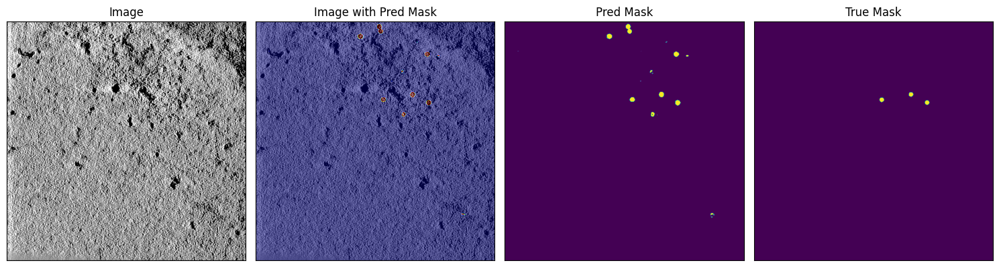

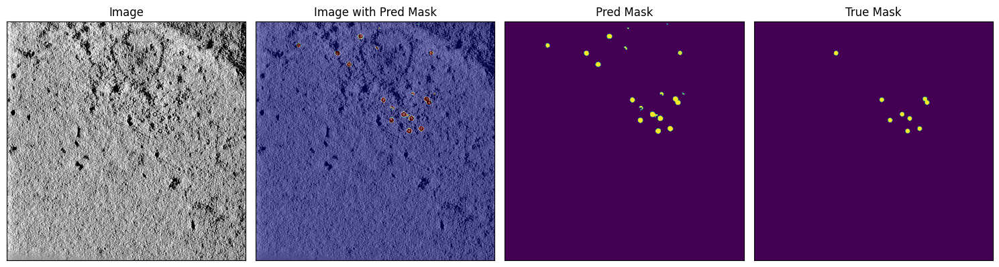

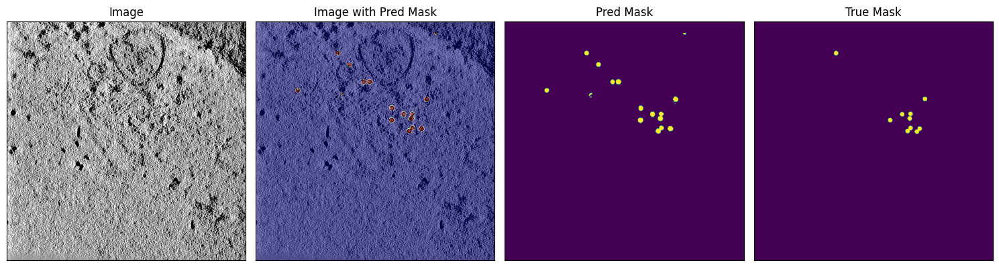

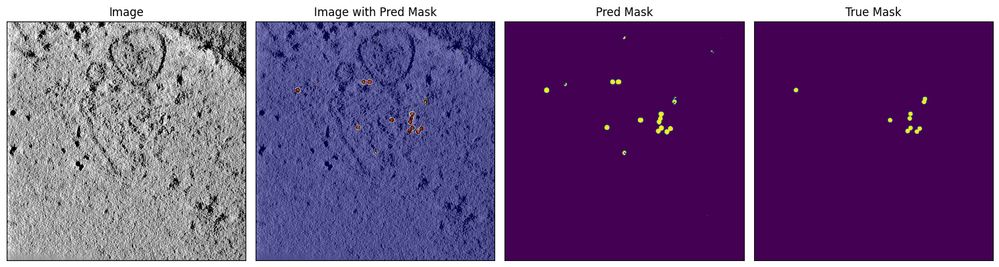

In [25]:
import matplotlib.pyplot as plt
from skimage.transform import resize
import numpy as np
import matplotlib.image as mpimg
import time
def display_model_out(model, test_dataset, size=1):
    start_time = time.perf_counter()
    test_data = []
    for i, (image, mask) in enumerate(test_dataset.take(size)):
        
        for img, ms in zip(image, mask):  
            pred_mask = model.predict(img[None, ...]).squeeze() 

            test_data.append({ 
                'image': img.numpy().astype("float32"),
                'true_mask': ms.numpy().astype("float32"),
                'pred_mask': pred_mask
            })
    end_time = time.perf_counter()

    print(f"Время предсказания U-Net: {end_time - start_time:.4f} секунд")

    flag = True
    for elem in test_data:
        image = elem['image']
        mask  = elem['true_mask']
        pred_mask = elem['pred_mask']
        
        fig = plt.figure(figsize=(15, 7))
        ax1 = plt.subplot(1, 4, 1)
        plt.xticks([])
        plt.yticks([])
        plt.title('Image')
        plt.imshow(image[:, :, 1], cmap='gray', vmin=0.0, vmax=1.0)
        if(flag):
            mpimg.imsave('output_image.png', image[:, :, 1], cmap='gray', vmin=0.0, vmax=1.0)
            flag = False

        ax2 = plt.subplot(1, 4, 2)              
        plt.xticks([])
        plt.yticks([])
        plt.title('Image with Pred Mask')
        plt.imshow(image[:, :, 1], cmap='gray', vmin=0.0, vmax=1.0)
        plt.imshow(pred_mask, cmap='jet', alpha=0.5)

        ax3 = plt.subplot(1, 4, 3)              
        plt.xticks([])
        plt.yticks([])
        plt.title('Pred Mask')
        plt.imshow(pred_mask)

        ax4 = plt.subplot(1, 4, 4)              
        plt.xticks([])
        plt.yticks([])
        plt.title('True Mask')
        plt.imshow(mask)
    
        plt.tight_layout()
        plt.show()


if DEBUG_MOD: display_model_out(model, test_ds)


Теперь посчитаем официальную метрику, в силу размера рецептивного поля и его шага можно выдавать предсказания его центр

In [26]:
import numpy as np
import tensorflow as tf
from scipy.ndimage import gaussian_filter, maximum_filter
from sklearn.cluster import DBSCAN
import numpy as np
import pandas as pd


from scipy.spatial import KDTree


#последний рабочий вариант
def average_z_for_close_points(points_list, long_z, debug=False):
    # Преобразуем список массивов в один numpy массив формы (n, 3)
    points = np.array(points_list)
    if len(points) == 0:
        return []

    # Создаём массив только с x и y для сравнения
    xy_coords = points[:, :2]
    
    # Находим уникальные комбинации x, y
    unique_xy = np.unique(xy_coords, axis=0)
    if debug: print('Уникальных точек (x, y) = ' + str(unique_xy.shape))
    # Создаём список для результата
    result = []
    
    # Для каждой уникальной пары (x, y)
    for xy in unique_xy:
        # Индексы точек с текущими x, y
        mask = np.all(xy_coords == xy, axis=1)
        z_values = sorted(points[mask, 2]) 
        
        if len(z_values) == 0:
            continue
        
        # Находим непрерывные отрезки по z
        segments = []
        current_segment = [z_values[0]]
        for z in z_values[1:]:
            if z - current_segment[-1] == 1: 
                current_segment.append(z)
            else:
                segments.append(current_segment)
                current_segment = [z]
        segments.append(current_segment)  # Добавляем последний отрезок
        
        # Усредняем z для каждого отрезка и добавляем в результат
        for segment in segments:
            if len(segment) <= long_z and long_z != 0:
                continue
            if debug: print('Сегмент: ' + str(segment))
            mean_z = np.mean(segment)
            if debug: print(' mean z = ' + str(mean_z))
            result.append([xy[0], xy[1], mean_z])
    
    return [np.array(point) for point in result]



"def average_z_for_close_points(points_list, debug=False):\n\n    points = np.array(points_list)\n    if len(points) == 0:\n        return []\n\n    xy_coords = points[:, :2]\n    unique_xy = np.unique(xy_coords, axis=0)\n    if debug: print('Уникальных точек (x, y) = ' + str(unique_xy.shape))\n    \n    result = []\n    trim_size = 3  # Усечение с каждого конца\n    max_distance = 3  # Максимальное расстояние до ближайшей точки\n    \n    for xy in unique_xy:\n        mask = np.all(xy_coords == xy, axis=1)\n        z_values = sorted(points[mask, 2])\n        \n        if len(z_values) == 0:\n            continue\n        \n        # Находим непрерывные отрезки по Z\n        segments = []\n        current_segment = [z_values[0]]\n        for z in z_values[1:]:\n            if z - current_segment[-1] == 1:\n                current_segment.append(z)\n            else:\n                segments.append(current_segment)\n                current_segment = [z]\n        segments.append(current

In [27]:
'''import tensorflow as tf
from numba import cuda
import gc

# Очистить память TensorFlow
tf.keras.backend.clear_session()'''

'import tensorflow as tf\nfrom numba import cuda\nimport gc\n\n# Очистить память TensorFlow\ntf.keras.backend.clear_session()'

Предсказываем маски
12/12 ━━━━━━━━━━━━━━━━━━━━ 18s 644ms/step
(184, 157, 157, 1)


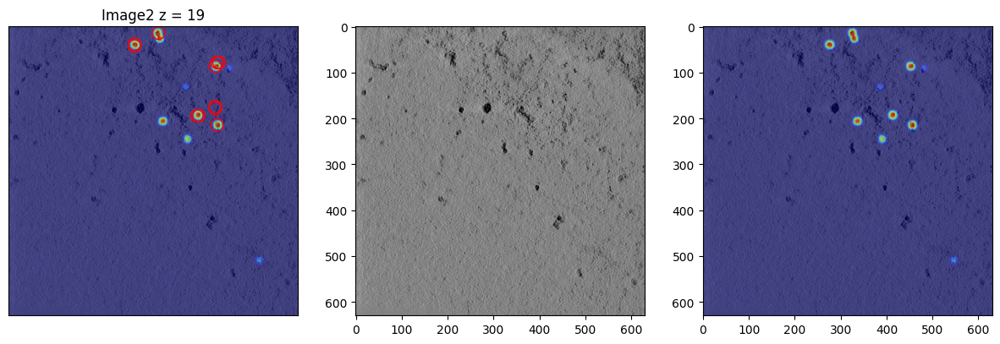

tp = 50 fp = 83 fn = 8
fbeta = 0.8011310084825636


In [28]:

threshold = 0.7

def create_circular_kernel(radius):
    """
    Создаёт 2D-круглое ядро радиусом radius.
    """
    size = 2 * radius
    kernel = np.zeros((size, size), dtype=np.float32)
    center = radius
    for i in range(size):
        for j in range(size):
            distance = np.sqrt((i - center) ** 2 + (j - center) ** 2)
            if distance <= radius:
                kernel[i, j] = 1.0
    # Нормализуем ядро, чтобы сумма элементов была равна 1 (для свёртки)
    kernel /= kernel.sum()
    return  tf.reshape(tf.convert_to_tensor(kernel, dtype=tf.float32), (size, size, 1, 1))
    
def filter_mask_by_centers(mask3d, centers_of_receptive_fields):
    """
    Фильтрует 3D-маску, оставляя только пиксели, соответствующие координатам из centers_of_receptive_fields.
    in:
        mask3d: Тензор формы (num_slices, 630, 630) - исходная маска.
        centers_of_receptive_fields: Тензор формы (158, 158, 2) - координаты (x, y) для каждого пикселя 158x158.
    out:
        Тензор формы (num_slices, 158, 158) - отфильтрованная маска.
    """
    # Преобразуем centers_of_receptive_fields в плоский список координат (24964, 2)
    centers_flat = tf.reshape(centers_of_receptive_fields, (-1, 2))  # (158*158, 2)
    centers_flat = tf.stack([centers_flat[:, 1], centers_flat[:, 0]], axis=-1)
    # Преобразуем координаты в целые числа (они не целые)
    centers_flat = tf.cast(centers_flat, tf.int32)

    # Создаем выходной тензор для отфильтрованных значений
    num_slices = tf.shape(mask3d)[0]
    output_mask = tf.zeros((num_slices, 158, 158), dtype=tf.float32)

    # Функция для обработки одного слоя
    @tf.function
    def filter_slice(mask_slice):
        # Извлекаем значения из mask_slice по координатам centers_flat
        values = tf.gather_nd(mask_slice, centers_flat)  # (24964,)
        # Преобразуем в форму 158x158
        return tf.reshape(values, (158, 158))

    # Применяем к каждому слою
    output_mask = tf.map_fn(
        filter_slice,
        mask3d,
        dtype=tf.float32
    )  # (num_slices, 158, 158)

    return output_mask


size_kernel = round(float(particle_radius['apo-ferritin']/scale_radius))
kernel = create_circular_kernel(size_kernel)
def predict_masks(model, images, long_z = 5, batch_size=32, debug=False):
    if debug: print('Предсказываем маски')

    normalized_data = tf.stack([normalize_image(slice_) for slice_ in images])
    img3d_batch = tf.stack([
        tf.stack([
            normalized_data[max(z - 2, 0)], 
            normalized_data[z], 
            normalized_data[min(len(images) - 1, z + 2)]], axis=-1)
        for z in range(len(images))
    ], axis=0)
    
    
    mask3d = model.predict(img3d_batch, batch_size=batch_size)
    mask3d = tf.where(mask3d > 0.9, mask3d, tf.zeros_like(mask3d))
    mask3d = tf.cast(mask3d > 0.9, tf.float32)
    mask3d = tf.nn.conv2d(
        input=mask3d,
        filters=kernel,
        strides=[1, 1, 1, 1],
        padding='SAME'  # Аналог mode='same' в scipy
    )
    mask3d = tf.nn.max_pool(
        mask3d,                # Входная маска
        ksize=[1, 4, 4, 1],    # Размер окна 4x4
        strides=[1, 4, 4, 1],  # Сдвиг 4 по обеим осям x, y
        padding='VALID'         # без падинга
    )
    if debug: print(mask3d.shape)
    # Обработка масок
    mask3d = tf.squeeze(mask3d)  # Удаляем канал
    zxy = tf.where(mask3d >= 0.009009009*109 - 0.001)  # Получаем координаты [z, y, x] для значений > threshold
    xyz = tf.gather(zxy, [2, 1, 0], axis=1).numpy()
    xyz = np.array(average_z_for_close_points(xyz, long_z = long_z, debug=False))
    #хотим восстановить центры макспулинга
    xyz[:, 0] = xyz[:, 0] * 4 + 2  # Умножаем x на 4 и прибавляем 2
    xyz[:, 1] = xyz[:, 1] * 4 + 2  # Умножаем y на 4 и прибавляем 2
    
    #print(xyz)
    if debug:
        fig = plt.figure(figsize=(15, 7))

        # Подграфик 1
        ax1 = plt.subplot(1, 3, 1)
        plt.xticks([])
        plt.yticks([])
        plt.title('Image2 z = 19')
        y = []
        x = []
        for p in xyz:
            if (p[2] - 19.0) < (particle_radius['apo-ferritin']/scale_radius)/2.0:
                y.append(p[1])
                x.append(p[0])
        ax1.scatter(x, y, edgecolor='red', s=np.pi*((particle_radius['apo-ferritin']/scale_radius)**2), facecolor='none')
        plt.imshow(images[19], cmap='gray', vmin=-0.00005, vmax=0.00005)
        plt.imshow(resize(np.array(mask3d[19]), (630, 630), mode='constant', preserve_range=True), cmap='jet', alpha=0.5)
        
        # Подграфик 2: создаём отдельную фигуру для сохранения только его
        fig2 = plt.figure(figsize=(5, 7))  # Новая фигура для второго подграфика
        ax2 = fig2.add_subplot(111)
        ax2.imshow(images[19], cmap='gray', vmin=-0.00005, vmax=0.00005)
        fig2.savefig('middle_image.png', bbox_inches='tight', dpi=300)  # Сохраняем только второй подграфик
        plt.close(fig2)  # Закрываем временную фигуру
        
        # Подграфик 2 в основной фигуре (для отображения)
        ax2 = plt.subplot(1, 3, 2)
        plt.imshow(images[19], cmap='gray', vmin=-0.00005, vmax=0.00005)
        
        # Подграфик 3
        ax3 = plt.subplot(1, 3, 3)
        plt.imshow(images[19], cmap='gray', vmin=-0.00005, vmax=0.00005)
        plt.imshow(resize(np.array(mask3d[19]), (630, 630), mode='constant', preserve_range=True), cmap='jet', alpha=0.5)
        
        plt.show()
    scale_matrix_np = np.array(scale_matrix)
    return np.dot(xyz, scale_matrix_np.T)

if DEBUG_MOD:
    xyz_path = 'xyz_predicted_unet2d_TS_6_4.npz'

    
    xyz = predict_masks(model, images = data['TS_6_4']['imgs'][0], batch_size=16, debug=DEBUG_MOD) 

    class ParticipantVisibleError(Exception):
        pass
    
    #https://www.kaggle.com/code/metric/czi-cryoet-84969 официальная метрика
    def compute_metrics(reference_points, reference_radius, candidate_points):
        num_reference_particles = len(reference_points)
        num_candidate_particles = len(candidate_points)
        
        if len(reference_points) == 0:
            return 0, num_candidate_particles, 0
    
        if len(candidate_points) == 0:
            return 0, 0, num_reference_particles
    
        ref_tree = KDTree(reference_points)
        candidate_tree = KDTree(candidate_points)
        raw_matches = candidate_tree.query_ball_tree(ref_tree, r=reference_radius)
        matches_within_threshold = []
        for match in raw_matches:
            matches_within_threshold.extend(match)
        # Prevent submitting multiple matches per particle.
        # This won't be be strictly correct in the (extremely rare) case where true particles
        # are very close to each other.
        matches_within_threshold = set(matches_within_threshold)
        tp = int(len(matches_within_threshold))
        fp = int(num_candidate_particles - tp)
        fn = int(num_reference_particles - tp)
        
        return tp, fp, fn
    
    #print(scale_matrix_inv)
    #print(scale_matrix)
    #print(np.dot(scale_matrix_inv, scale_matrix))
    # посчитаем fbeta как в официальной метрике
    tp, fp, fn = compute_metrics([np.dot(np.array([p['x'], p['y'], p['z']]), np.array(scale_matrix).T) for p in data['TS_6_4']['points']['apo_ferritin']], particle_radius['apo-ferritin']/(2.0), xyz)

    print('tp = ' + str(tp) + ' fp = ' + str(fp) + ' fn = ' + str(fn))
        
    precision = tp / (tp + fp) if tp + fp > 0 else 0
    recall = tp / (tp + fn) if tp + fn > 0 else 0
    beta = 4.0
    fbeta = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall) if (precision + recall) > 0 else 0.0
    print('fbeta = ' + str(fbeta))
    #print(xyz)
if False:
    xyz_path = 'xyz_predicted_unet2d_TS_6_4.npz'
    xyz_dic = {}

    for i in range(13):
        xyz_dic[i] = predict_masks(model, long_z = i, images = data['TS_6_4']['imgs'][0], batch_size=16, debug=DEBUG_MOD) 

    class ParticipantVisibleError(Exception):
        pass
    
    #https://www.kaggle.com/code/metric/czi-cryoet-84969 официальная метрика
    def compute_metrics(reference_points, reference_radius, candidate_points):
        num_reference_particles = len(reference_points)
        num_candidate_particles = len(candidate_points)
        
        if len(reference_points) == 0:
            return 0, num_candidate_particles, 0
    
        if len(candidate_points) == 0:
            return 0, 0, num_reference_particles
    
        ref_tree = KDTree(reference_points)
        candidate_tree = KDTree(candidate_points)
        raw_matches = candidate_tree.query_ball_tree(ref_tree, r=reference_radius)
        matches_within_threshold = []
        for match in raw_matches:
            matches_within_threshold.extend(match)
        # Prevent submitting multiple matches per particle.
        # This won't be be strictly correct in the (extremely rare) case where true particles
        # are very close to each other.
        matches_within_threshold = set(matches_within_threshold)
        tp = int(len(matches_within_threshold))
        fp = int(num_candidate_particles - tp)
        fn = int(num_reference_particles - tp)
        
        return tp, fp, fn
    
    #print(scale_matrix_inv)
    #print(scale_matrix)
    #print(np.dot(scale_matrix_inv, scale_matrix))
    # посчитаем fbeta как в официальной метрике
    for i, xyz in xyz_dic.items():
        tp, fp, fn = compute_metrics([np.dot(np.array([p['x'], p['y'], p['z']]), np.array(scale_matrix).T) for p in data['TS_6_4']['points']['apo_ferritin']], particle_radius['apo-ferritin']/(2.0), xyz)
        print('long_z = ' + str(i))
        print('tp = ' + str(tp) + ' fp = ' + str(fp) + ' fn = ' + str(fn))
        
        precision = tp / (tp + fp) if tp + fp > 0 else 0
        recall = tp / (tp + fn) if tp + fn > 0 else 0
        beta = 4.0
        fbeta = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall) if (precision + recall) > 0 else 0.0
        print('fbeta = ' + str(fbeta))
    #print(xyz)

In [29]:


import matplotlib.pyplot as plt

if DEBUG_MOD and NEED_TO_CREATE_MODEL_FROM_ZERO:
    plt.figure(figsize=(12, 6))
    
    # график потерь
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='val loss')
    plt.title('loss over epochs')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    
    # график метрики
    plt.subplot(1, 2, 2)
    plt.plot(history.history['fbeta_metric'], label='train fbeta_metric')
    plt.plot(history.history['val_fbeta_metric'], label='val fbeta_metric')
    plt.title('')
    plt.xlabel('epochs')
    plt.ylabel('')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    model.summary()

In [30]:
import os
import zarr
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_probability as tfp
import time
import csv



#start_time = time.time()

directory_path = '/kaggle/input/czii-cryo-et-object-identification/test/static/ExperimentRuns'
folder_names = [f for f in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, f))]

#folder_names = [folder_names[0]]  # для проверки

centers_of_receptive_fields_np = np.array(centers_of_receptive_fields)
all_data = []
id_counter = 0


for name in folder_names:
    
    if True:
        #print(f"Обработка папки: {name}")
        path_of_imgs = os.path.join(directory_path, name, 'VoxelSpacing10.000', 'denoised.zarr')
        test_data = zarr.open(path_of_imgs, mode='r')
        test_array = test_data['0']  # Обращаемся к массиву '0'
        print(f"Размер массива '0': {test_array.shape}")
        start_time = time.perf_counter()
        xyz = predict_masks(model, images=test_data[0], debug=False, batch_size=16)
        end_time = time.perf_counter()
        print(f"Время предсказания U-Net: {end_time - start_time:.4f} секунд")
        if len(xyz) == 0:
            print(f"Предупреждение: для {name} не найдено точек")
            continue
            
        for point in xyz:
            all_data.append((id_counter, name, 'apo-ferritin', point[0], point[1], point[2]))
            id_counter += 1

df = pd.DataFrame(all_data, columns=['id','experiment','particle_type','x','y','z'])
df.to_csv("submission.csv", index=False)


Размер массива '0': (184, 630, 630)
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step
Время предсказания U-Net: 9.1510 секунд
Размер массива '0': (184, 630, 630)
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step
Время предсказания U-Net: 8.3294 секунд
Размер массива '0': (184, 630, 630)
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step
Время предсказания U-Net: 8.6535 секунд
